In [1]:
!pip install imblearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns',None)

  Using cached imblearn-0.0-py2.py3-none-any.whl (1.9 kB)
  Using cached imbalanced_learn-0.9.0-py3-none-any.whl (199 kB)


In [2]:
data=pd.read_csv(r"E:\data trained projects\Evaluation Projects\assignment 3\Telecom_customer_churn.csv")

In [3]:
data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [4]:
data.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [5]:
data.shape

(7043, 21)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [7]:
data.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [8]:
# check categorical column
for column in data.columns:
    if data[column].dtype==object:
        print(str(column)+ " : "+str(data[column].unique()))
        print(data[column].value_counts())
        print('-------------------------------------')

customerID : ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']
7590-VHVEG    1
3791-LGQCY    1
6008-NAIXK    1
5956-YHHRX    1
5365-LLFYV    1
             ..
9796-MVYXX    1
2637-FKFSY    1
1552-AAGRX    1
4304-TSPVK    1
3186-AJIEK    1
Name: customerID, Length: 7043, dtype: int64
-------------------------------------
gender : ['Female' 'Male']
Male      3555
Female    3488
Name: gender, dtype: int64
-------------------------------------
Partner : ['Yes' 'No']
No     3641
Yes    3402
Name: Partner, dtype: int64
-------------------------------------
Dependents : ['No' 'Yes']
No     4933
Yes    2110
Name: Dependents, dtype: int64
-------------------------------------
PhoneService : ['No' 'Yes']
Yes    6361
No      682
Name: PhoneService, dtype: int64
-------------------------------------
MultipleLines : ['No phone service' 'No' 'Yes']
No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64
---------

In [9]:
# check categorical column
for column in data.columns:
    if data[column].dtype!=object:
        print(str(column)+ " : "+str(data[column].unique()))
        print(data[column].value_counts())
        print('-------------------------------------')

SeniorCitizen : [0 1]
0    5901
1    1142
Name: SeniorCitizen, dtype: int64
-------------------------------------
tenure : [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]
1     613
72    362
2     238
3     200
4     176
     ... 
28     57
39     56
44     51
36     50
0      11
Name: tenure, Length: 73, dtype: int64
-------------------------------------
MonthlyCharges : [29.85 56.95 53.85 ... 63.1  44.2  78.7 ]
20.05     61
19.85     45
19.95     44
19.90     44
20.00     43
          ..
23.65      1
114.70     1
43.65      1
87.80      1
78.70      1
Name: MonthlyCharges, Length: 1585, dtype: int64
-------------------------------------


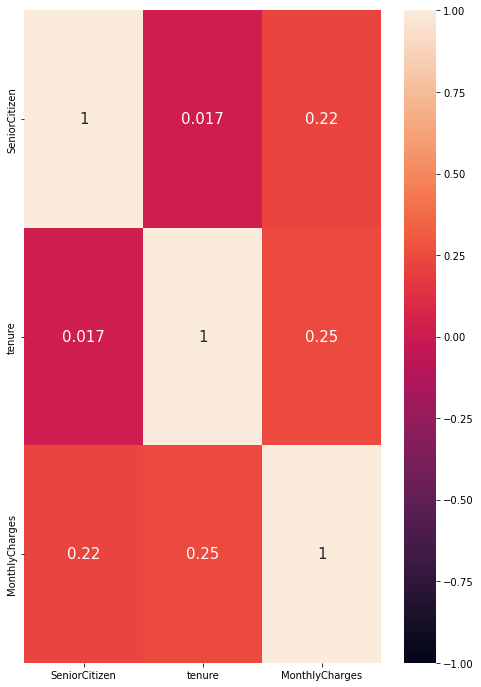

In [10]:
plt.figure(figsize=(8,12))
sns.heatmap(data.corr(),annot=True,vmin=-1,vmax=1,annot_kws={'size':15})
plt.show()

<AxesSubplot:xlabel='gender', ylabel='count'>

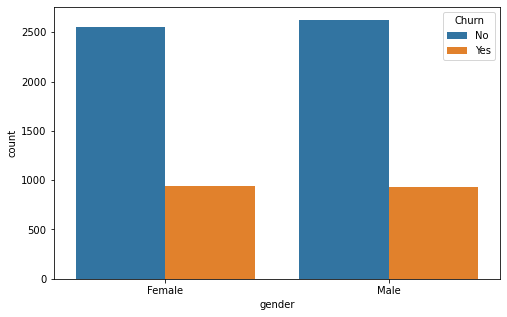

In [11]:
plt.figure(figsize=(8,5))
sns.countplot('gender',hue='Churn',data=data)

<AxesSubplot:xlabel='SeniorCitizen', ylabel='count'>

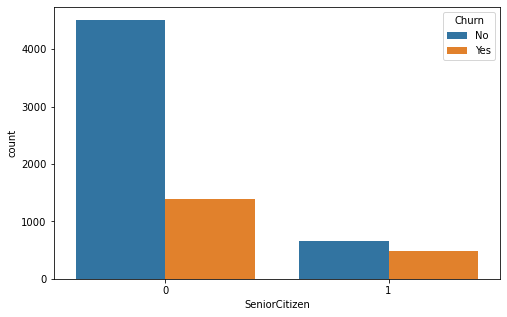

In [12]:
plt.figure(figsize=(8,5))
sns.countplot('SeniorCitizen',hue='Churn',data=data)

<AxesSubplot:xlabel='Partner', ylabel='count'>

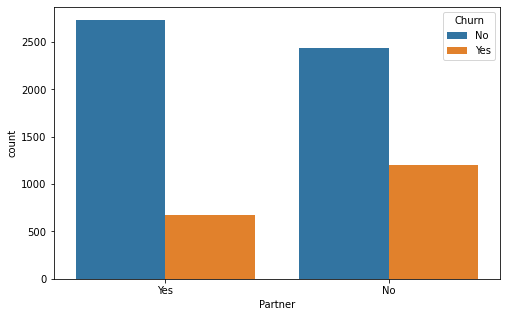

In [13]:
plt.figure(figsize=(8,5))
sns.countplot('Partner',hue='Churn',data=data)

<AxesSubplot:xlabel='Dependents', ylabel='count'>

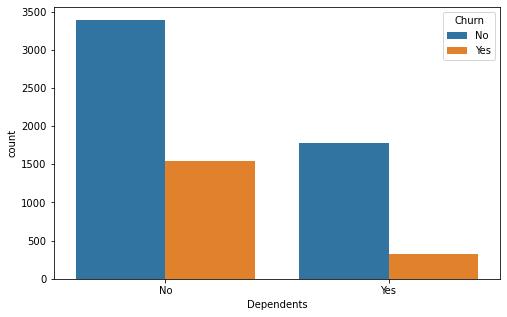

In [14]:
plt.figure(figsize=(8,5))
sns.countplot('Dependents',hue='Churn',data=data)

<AxesSubplot:xlabel='PhoneService', ylabel='count'>

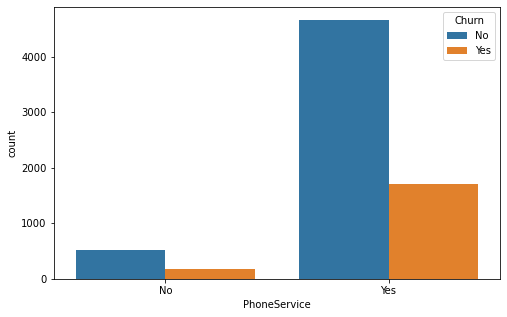

In [15]:
plt.figure(figsize=(8,5))
sns.countplot('PhoneService',hue='Churn',data=data)

<AxesSubplot:xlabel='MultipleLines', ylabel='count'>

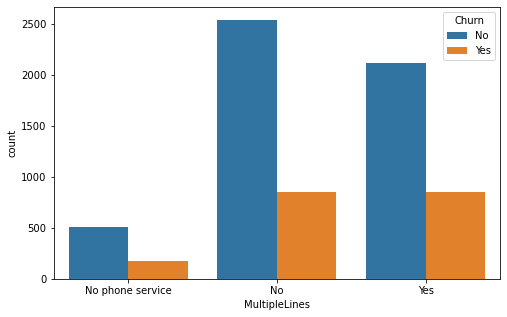

In [16]:
plt.figure(figsize=(8,5))
sns.countplot('MultipleLines',hue='Churn',data=data)

<AxesSubplot:xlabel='InternetService', ylabel='count'>

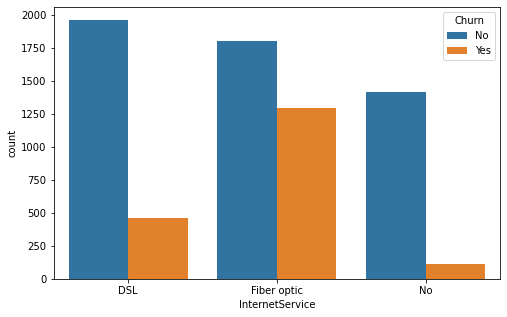

In [17]:
plt.figure(figsize=(8,5))
sns.countplot('InternetService',hue='Churn',data=data)

<AxesSubplot:xlabel='OnlineSecurity', ylabel='count'>

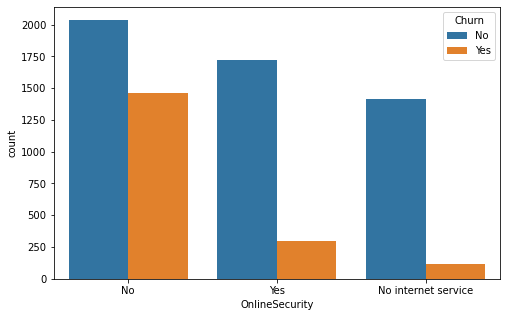

In [18]:
plt.figure(figsize=(8,5))
sns.countplot('OnlineSecurity',hue='Churn',data=data)

<AxesSubplot:xlabel='OnlineBackup', ylabel='count'>

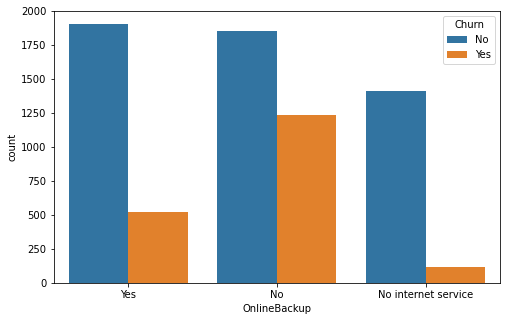

In [19]:
plt.figure(figsize=(8,5))
sns.countplot('OnlineBackup',hue='Churn',data=data)

<AxesSubplot:xlabel='DeviceProtection', ylabel='count'>

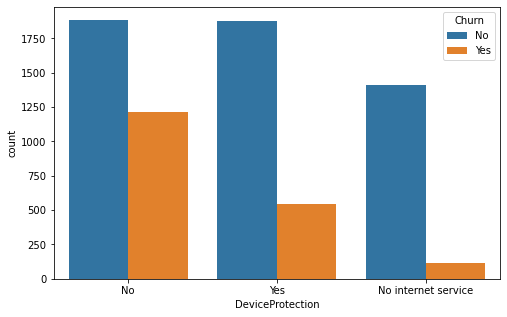

In [20]:
plt.figure(figsize=(8,5))
sns.countplot('DeviceProtection',hue='Churn',data=data)

<AxesSubplot:xlabel='TechSupport', ylabel='count'>

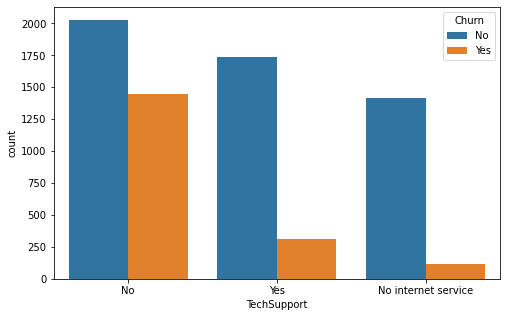

In [21]:
plt.figure(figsize=(8,5))
sns.countplot('TechSupport',hue='Churn',data=data)

<AxesSubplot:xlabel='StreamingTV', ylabel='count'>

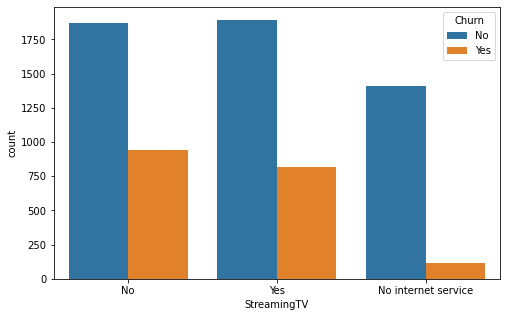

In [22]:
plt.figure(figsize=(8,5))
sns.countplot('StreamingTV',hue='Churn',data=data)

<AxesSubplot:xlabel='StreamingMovies', ylabel='count'>

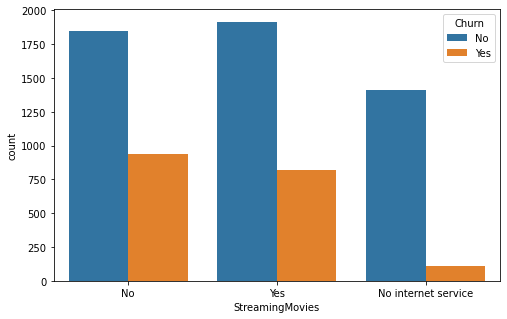

In [23]:
plt.figure(figsize=(8,5))
sns.countplot('StreamingMovies',hue='Churn',data=data)

<AxesSubplot:xlabel='Contract', ylabel='count'>

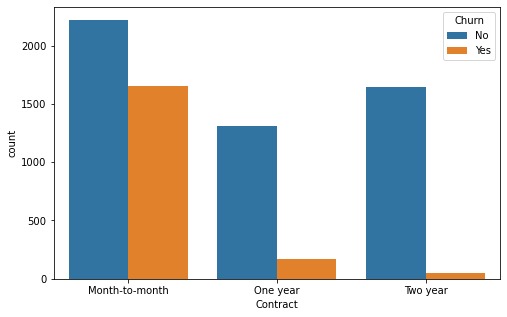

In [24]:
plt.figure(figsize=(8,5))
sns.countplot('Contract',hue='Churn',data=data)

<AxesSubplot:xlabel='PaperlessBilling', ylabel='count'>

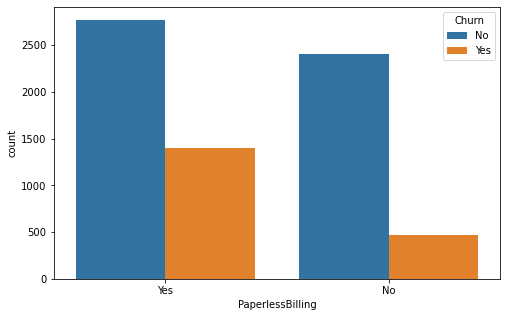

In [25]:
plt.figure(figsize=(8,5))
sns.countplot('PaperlessBilling',hue='Churn',data=data)

<AxesSubplot:xlabel='PaymentMethod', ylabel='count'>

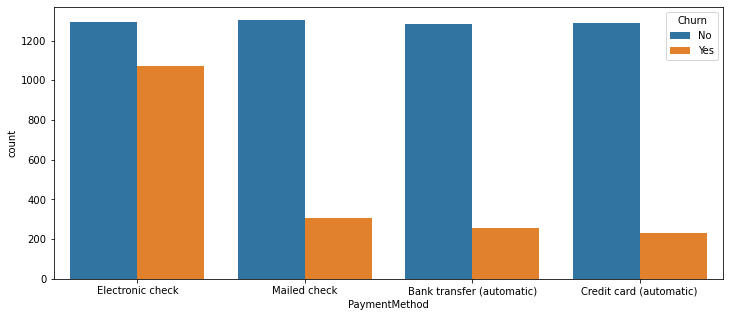

In [26]:
plt.figure(figsize=(12,5))
sns.countplot('PaymentMethod',hue='Churn',data=data)

In [27]:
data['TotalCharges']=data['TotalCharges'].replace(" ",np.NaN).astype(float)

In [28]:
data['TotalCharges'].isnull().sum()

11

In [29]:
data['TotalCharges']=data['TotalCharges'].fillna(data['TotalCharges'].mean())

In [30]:
df=pd.get_dummies(data,columns=['customerID','gender','Partner','Dependents','PhoneService','MultipleLines','InternetService','OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies','Contract','PaperlessBilling','PaymentMethod',],drop_first=True)
df

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,Churn,customerID_0003-MKNFE,customerID_0004-TLHLJ,customerID_0011-IGKFF,customerID_0013-EXCHZ,customerID_0013-MHZWF,customerID_0013-SMEOE,customerID_0014-BMAQU,customerID_0015-UOCOJ,customerID_0016-QLJIS,customerID_0017-DINOC,customerID_0017-IUDMW,customerID_0018-NYROU,customerID_0019-EFAEP,customerID_0019-GFNTW,customerID_0020-INWCK,customerID_0020-JDNXP,customerID_0021-IKXGC,customerID_0022-TCJCI,customerID_0023-HGHWL,customerID_0023-UYUPN,customerID_0023-XUOPT,customerID_0027-KWYKW,customerID_0030-FNXPP,customerID_0031-PVLZI,customerID_0032-PGELS,customerID_0036-IHMOT,customerID_0040-HALCW,customerID_0042-JVWOJ,customerID_0042-RLHYP,customerID_0048-LUMLS,customerID_0048-PIHNL,customerID_0052-DCKON,customerID_0052-YNYOT,customerID_0056-EPFBG,customerID_0057-QBUQH,customerID_0058-EVZWM,customerID_0060-FUALY,customerID_0064-SUDOG,customerID_0064-YIJGF,customerID_0067-DKWBL,customerID_0068-FIGTF,customerID_0071-NDAFP,customerID_0074-HDKDG,customerID_0076-LVEPS,customerID_0078-XZMHT,customerID_0080-EMYVY,customerID_0080-OROZO,customerID_0082-LDZUE,customerID_0082-OQIQY,customerID_0083-PIVIK,customerID_0089-IIQKO,customerID_0093-EXYQL,customerID_0093-XWZFY,customerID_0094-OIFMO,customerID_0096-BXERS,customerID_0096-FCPUF,customerID_0098-BOWSO,customerID_0100-DUVFC,customerID_0103-CSITQ,customerID_0104-PPXDV,customerID_0106-GHRQR,customerID_0106-UGRDO,customerID_0107-WESLM,customerID_0107-YHINA,customerID_0111-KLBQG,customerID_0112-QAWRZ,customerID_0112-QWPNC,customerID_0114-IGABW,customerID_0114-PEGZZ,customerID_0114-RSRRW,customerID_0115-TFERT,customerID_0117-LFRMW,customerID_0118-JPNOY,customerID_0121-SNYRK,customerID_0122-OAHPZ,customerID_0123-CRBRT,customerID_0125-LZQXK,customerID_0128-MKWSG,customerID_0129-KPTWJ,customerID_0129-QMPDR,customerID_0130-SXOUN,customerID_0133-BMFZO,customerID_0134-XWXCE,customerID_0135-NMXAP,customerID_0136-IFMYD,customerID_0137-OCGAB,customerID_0137-UDEUO,customerID_0139-IVFJG,customerID_0141-YEAYS,customerID_0142-GVYSN,customerID_0147-ESWWR,customerID_0148-DCDOS,customerID_0151-ONTOV,customerID_0156-FVPTA,customerID_0164-APGRB,customerID_0164-XAIRP,customerID_0168-XZKBB,customerID_0174-QRVVY,customerID_0177-PXBAT,customerID_0178-CIIKR,customerID_0178-SZBHO,customerID_0181-RITDD,customerID_0186-CAERR,customerID_0187-QSXOE,customerID_0187-WZNAB,customerID_0188-GWFLE,customerID_0191-EQUUH,customerID_0191-ZHSKZ,customerID_0193-ESZXP,customerID_0195-IESCP,customerID_0196-JTUQI,customerID_0196-VULGZ,customerID_0197-PNKNK,customerID_0201-MIBOL,customerID_0201-OAMXR,customerID_0203-HHYIJ,customerID_0206-OYVOC,customerID_0206-TBWLC,customerID_0207-MDKNV,customerID_0208-BPQEJ,customerID_0212-ISBBF,customerID_0214-JHPFW,customerID_0215-BQKGS,customerID_0218-QNVAS,customerID_0219-QAERP,customerID_0219-YTZUE,customerID_0220-EBGCE,customerID_0221-NAUXK,customerID_0221-WMXNQ,customerID_0222-CNVPT,customerID_0224-HJAPT,customerID_0224-NIJLP,customerID_0224-RLWWD,customerID_0225-ZORZP,customerID_0228-MAUWC,customerID_0229-LFJAF,customerID_0230-UBYPQ,customerID_0230-WEQUW,customerID_0231-LXVAP,customerID_0233-FTHAV,customerID_0234-TEVTT,customerID_0235-KGSLC,customerID_0236-HFWSV,customerID_0237-YFUTL,customerID_0238-WHBIQ,customerID_0239-OXEXL,customerID_0244-LGNFY,customerID_0247-SLUJI,customerID_0248-IPDFW,customerID_0248-PGHBZ,customerID_0253-ZTEOB,customerID_0254-FNMCI,customerID_0254-KCJGT,customerID_0254-WWRKD,customerID_0256-LTHVJ,customerID_0257-KXZGU,customerID_0257-ZESQC,customerID_0258-NOKBL,customerID_0259-GBZSH,customerID_0260-ZDLGK,customerID_0263-FJTQO,customerID_0264-CNITK,customerID_0265-EDXBD,customerID_0265-PSUAE,customerID_0266-CLZKZ,customerID_0266-GMEAO,customerID_0268-QKIWO,customerID_0269-XFESX,customerID_0270-THENM,customerID_0274-JKUJR,customerID_0277-BKSQP,customerID_0277-ORXQS,customerID_0278-YXOOG,customerID_0280-XJGEX,customerID_0281-CNTZX,customerID_0282-NVSJS,customerID_0285-INHLN,customerID_0289-IVARM,customerID_0292-WEGCH,custom

In [31]:
from sklearn.preprocessing import LabelEncoder

In [32]:
le=LabelEncoder()

In [33]:
df['Churn']=le.fit_transform(df['Churn'])

In [34]:
df

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,Churn,customerID_0003-MKNFE,customerID_0004-TLHLJ,customerID_0011-IGKFF,customerID_0013-EXCHZ,customerID_0013-MHZWF,customerID_0013-SMEOE,customerID_0014-BMAQU,customerID_0015-UOCOJ,customerID_0016-QLJIS,customerID_0017-DINOC,customerID_0017-IUDMW,customerID_0018-NYROU,customerID_0019-EFAEP,customerID_0019-GFNTW,customerID_0020-INWCK,customerID_0020-JDNXP,customerID_0021-IKXGC,customerID_0022-TCJCI,customerID_0023-HGHWL,customerID_0023-UYUPN,customerID_0023-XUOPT,customerID_0027-KWYKW,customerID_0030-FNXPP,customerID_0031-PVLZI,customerID_0032-PGELS,customerID_0036-IHMOT,customerID_0040-HALCW,customerID_0042-JVWOJ,customerID_0042-RLHYP,customerID_0048-LUMLS,customerID_0048-PIHNL,customerID_0052-DCKON,customerID_0052-YNYOT,customerID_0056-EPFBG,customerID_0057-QBUQH,customerID_0058-EVZWM,customerID_0060-FUALY,customerID_0064-SUDOG,customerID_0064-YIJGF,customerID_0067-DKWBL,customerID_0068-FIGTF,customerID_0071-NDAFP,customerID_0074-HDKDG,customerID_0076-LVEPS,customerID_0078-XZMHT,customerID_0080-EMYVY,customerID_0080-OROZO,customerID_0082-LDZUE,customerID_0082-OQIQY,customerID_0083-PIVIK,customerID_0089-IIQKO,customerID_0093-EXYQL,customerID_0093-XWZFY,customerID_0094-OIFMO,customerID_0096-BXERS,customerID_0096-FCPUF,customerID_0098-BOWSO,customerID_0100-DUVFC,customerID_0103-CSITQ,customerID_0104-PPXDV,customerID_0106-GHRQR,customerID_0106-UGRDO,customerID_0107-WESLM,customerID_0107-YHINA,customerID_0111-KLBQG,customerID_0112-QAWRZ,customerID_0112-QWPNC,customerID_0114-IGABW,customerID_0114-PEGZZ,customerID_0114-RSRRW,customerID_0115-TFERT,customerID_0117-LFRMW,customerID_0118-JPNOY,customerID_0121-SNYRK,customerID_0122-OAHPZ,customerID_0123-CRBRT,customerID_0125-LZQXK,customerID_0128-MKWSG,customerID_0129-KPTWJ,customerID_0129-QMPDR,customerID_0130-SXOUN,customerID_0133-BMFZO,customerID_0134-XWXCE,customerID_0135-NMXAP,customerID_0136-IFMYD,customerID_0137-OCGAB,customerID_0137-UDEUO,customerID_0139-IVFJG,customerID_0141-YEAYS,customerID_0142-GVYSN,customerID_0147-ESWWR,customerID_0148-DCDOS,customerID_0151-ONTOV,customerID_0156-FVPTA,customerID_0164-APGRB,customerID_0164-XAIRP,customerID_0168-XZKBB,customerID_0174-QRVVY,customerID_0177-PXBAT,customerID_0178-CIIKR,customerID_0178-SZBHO,customerID_0181-RITDD,customerID_0186-CAERR,customerID_0187-QSXOE,customerID_0187-WZNAB,customerID_0188-GWFLE,customerID_0191-EQUUH,customerID_0191-ZHSKZ,customerID_0193-ESZXP,customerID_0195-IESCP,customerID_0196-JTUQI,customerID_0196-VULGZ,customerID_0197-PNKNK,customerID_0201-MIBOL,customerID_0201-OAMXR,customerID_0203-HHYIJ,customerID_0206-OYVOC,customerID_0206-TBWLC,customerID_0207-MDKNV,customerID_0208-BPQEJ,customerID_0212-ISBBF,customerID_0214-JHPFW,customerID_0215-BQKGS,customerID_0218-QNVAS,customerID_0219-QAERP,customerID_0219-YTZUE,customerID_0220-EBGCE,customerID_0221-NAUXK,customerID_0221-WMXNQ,customerID_0222-CNVPT,customerID_0224-HJAPT,customerID_0224-NIJLP,customerID_0224-RLWWD,customerID_0225-ZORZP,customerID_0228-MAUWC,customerID_0229-LFJAF,customerID_0230-UBYPQ,customerID_0230-WEQUW,customerID_0231-LXVAP,customerID_0233-FTHAV,customerID_0234-TEVTT,customerID_0235-KGSLC,customerID_0236-HFWSV,customerID_0237-YFUTL,customerID_0238-WHBIQ,customerID_0239-OXEXL,customerID_0244-LGNFY,customerID_0247-SLUJI,customerID_0248-IPDFW,customerID_0248-PGHBZ,customerID_0253-ZTEOB,customerID_0254-FNMCI,customerID_0254-KCJGT,customerID_0254-WWRKD,customerID_0256-LTHVJ,customerID_0257-KXZGU,customerID_0257-ZESQC,customerID_0258-NOKBL,customerID_0259-GBZSH,customerID_0260-ZDLGK,customerID_0263-FJTQO,customerID_0264-CNITK,customerID_0265-EDXBD,customerID_0265-PSUAE,customerID_0266-CLZKZ,customerID_0266-GMEAO,customerID_0268-QKIWO,customerID_0269-XFESX,customerID_0270-THENM,customerID_0274-JKUJR,customerID_0277-BKSQP,customerID_0277-ORXQS,customerID_0278-YXOOG,customerID_0280-XJGEX,customerID_0281-CNTZX,customerID_0282-NVSJS,customerID_0285-INHLN,customerID_0289-IVARM,customerID_0292-WEGCH,custom

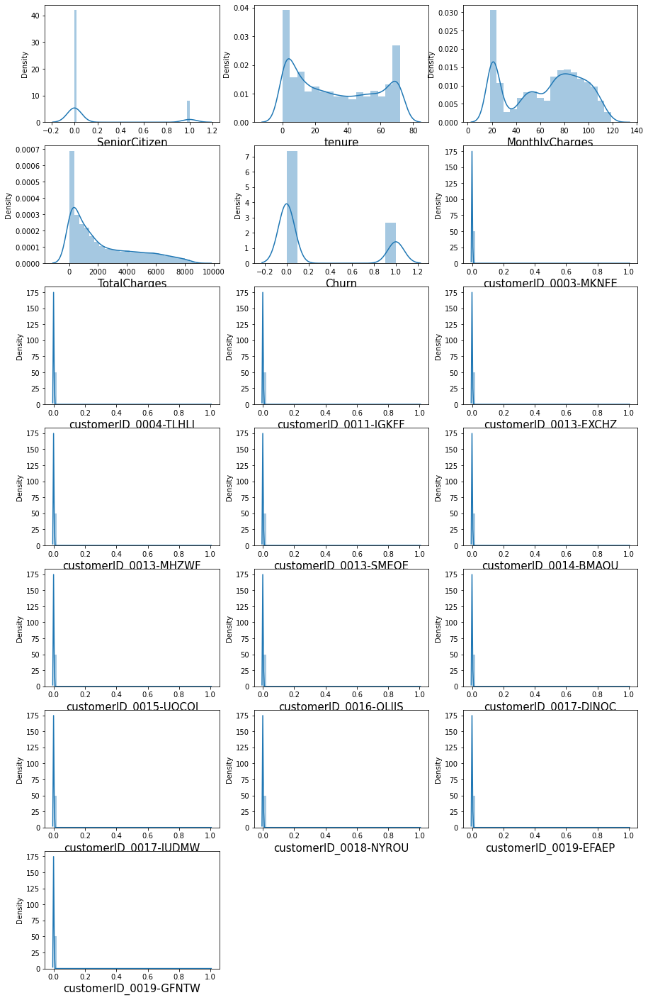

In [35]:
plt.figure(figsize=(15,25))
graph=1
for column in df:
    if graph<=19:
        ax=plt.subplot(7,3,graph)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=15)
    graph+=1
plt.show()

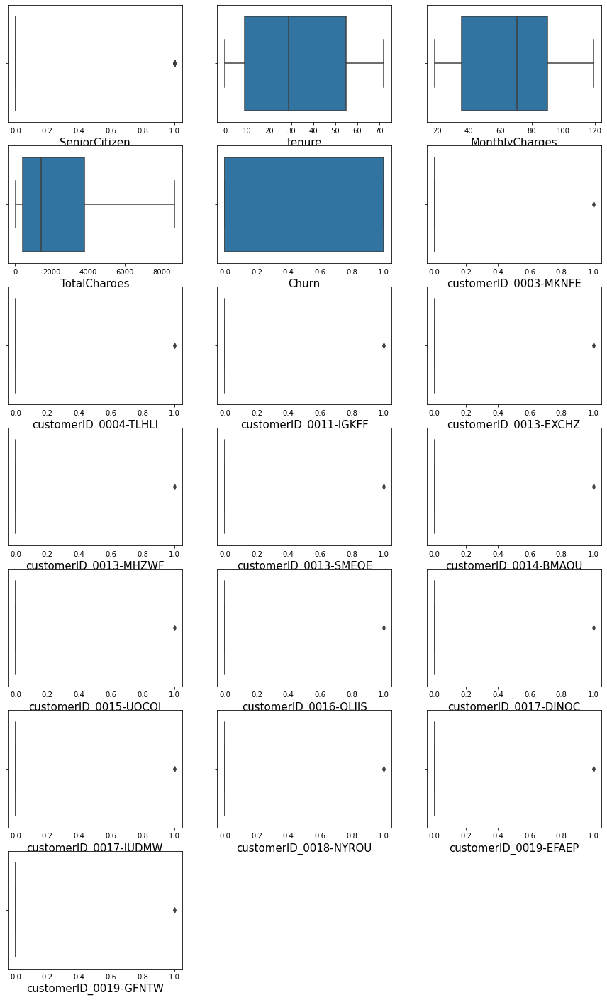

In [36]:
plt.figure(figsize=(15,25))
graph=1
for column in df:
    if graph<=19:
        ax=plt.subplot(7,3,graph)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize=15)
    graph+=1
plt.show()

In [37]:
x=df.drop(columns=['Churn'])
y=df['Churn']

In [38]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [39]:
x_scaled=scaler.fit_transform(x)

In [40]:
from sklearn.ensemble import ExtraTreesRegressor
selection=ExtraTreesRegressor()
selection.fit(x,y)

ExtraTreesRegressor()

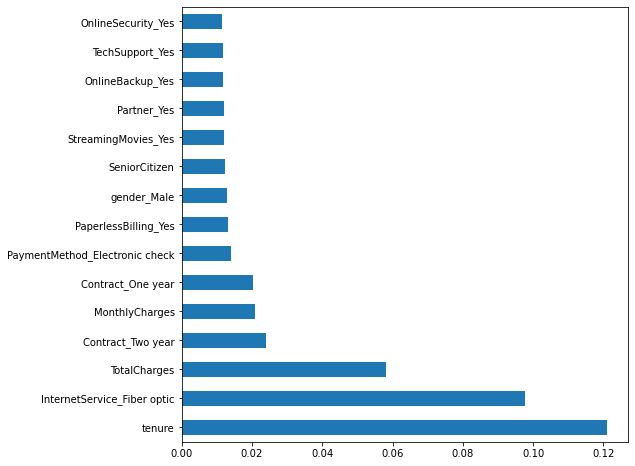

In [41]:
plt.figure(figsize=(8,8))
feat_importances=pd.Series(selection.feature_importances_,index=x.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [42]:
from sklearn.utils import resample

In [43]:
df['Churn'].value_counts()

0    5174
1    1869
Name: Churn, dtype: int64

In [44]:
not_churn=df[df.Churn==0]
churn=df[df.Churn==1]

In [45]:
not_churn_sample=not_churn.sample(n=1869)

In [46]:
new_churn=pd.concat([not_churn_sample,churn],axis=0)

In [47]:
new_churn['Churn'].value_counts()

0    1869
1    1869
Name: Churn, dtype: int64

In [48]:
x=new_churn.drop(columns=['Churn'],axis=1)
y=new_churn['Churn']

In [49]:
x.shape

(3738, 7072)

In [50]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [51]:
x_scaled=scaler.fit_transform(x)

In [52]:
from sklearn.ensemble import ExtraTreesRegressor
selection=ExtraTreesRegressor()
selection.fit(x,y)

ExtraTreesRegressor()

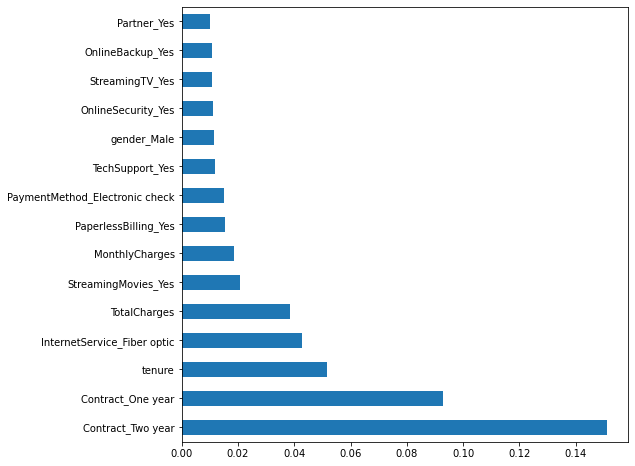

In [53]:
plt.figure(figsize=(8,8))
feat_importances=pd.Series(selection.feature_importances_,index=x.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [54]:
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV

In [55]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,f1_score

In [56]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.30,random_state=55,stratify=y)

In [57]:
from sklearn.linear_model import LogisticRegression

In [58]:
lr=LogisticRegression()

In [59]:
lr.fit(x_train,y_train)

LogisticRegression()

In [60]:
lr.score(x_train,y_train)

1.0

In [61]:
lr_pred=lr.predict(x_test)

In [62]:
accuracy=accuracy_score(y_test,lr_pred)
accuracy

0.7540106951871658

In [63]:
lr_cross_score=cross_val_score(lr,x,y,cv=5,scoring='accuracy').mean()
lr_cross_score

0.7632376207145873

In [64]:
print(confusion_matrix(y_test,lr_pred))

[[394 167]
 [109 452]]


In [65]:
print(classification_report(y_test,lr_pred))

              precision    recall  f1-score   support

           0       0.78      0.70      0.74       561
           1       0.73      0.81      0.77       561

    accuracy                           0.75      1122
   macro avg       0.76      0.75      0.75      1122
weighted avg       0.76      0.75      0.75      1122



In [66]:
from sklearn.neighbors import KNeighborsClassifier

In [67]:
knn=KNeighborsClassifier()

In [68]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [69]:
knn_pred=knn.predict(x_test)

In [70]:
accuracy=accuracy_score(y_test,knn_pred)
accuracy

0.7237076648841355

In [71]:
knn_cross_score=cross_val_score(knn,x,y,cv=5,scoring='accuracy').mean()
knn_cross_score

0.6974296472879038

In [72]:
print(confusion_matrix(y_test,knn_pred))

[[370 191]
 [119 442]]


In [73]:
print(classification_report(y_test,knn_pred))

              precision    recall  f1-score   support

           0       0.76      0.66      0.70       561
           1       0.70      0.79      0.74       561

    accuracy                           0.72      1122
   macro avg       0.73      0.72      0.72      1122
weighted avg       0.73      0.72      0.72      1122



In [74]:
from sklearn.svm import SVC

In [75]:
svc=SVC()

In [76]:
svc.fit(x_train,y_train)

SVC()

In [77]:
svc_pred=svc.predict(x_test)

In [78]:
accuracy=accuracy_score(y_test,svc_pred)
accuracy

0.7540106951871658

In [79]:
svc_cross_score=cross_val_score(svc,x,y,cv=5,scoring='accuracy').mean()
svc_cross_score

0.6316238214891652

In [80]:
print(confusion_matrix(y_test,svc_pred))

[[374 187]
 [ 89 472]]


In [81]:
print(classification_report(y_test,svc_pred))

              precision    recall  f1-score   support

           0       0.81      0.67      0.73       561
           1       0.72      0.84      0.77       561

    accuracy                           0.75      1122
   macro avg       0.76      0.75      0.75      1122
weighted avg       0.76      0.75      0.75      1122



In [82]:
from sklearn.tree import DecisionTreeClassifier

In [83]:
dt=DecisionTreeClassifier()

In [84]:
dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [85]:
dt_pred=dt.predict(x_test)

In [86]:
accuracy=accuracy_score(y_test,dt_pred)
accuracy

0.7201426024955436

In [87]:
dt_cross_score=cross_val_score(dt,x,y,cv=5,scoring='accuracy').mean()
dt_cross_score

0.7166910064500426

In [88]:
print(confusion_matrix(y_test,dt_pred))

[[398 163]
 [151 410]]


In [89]:
print(classification_report(y_test,dt_pred))

              precision    recall  f1-score   support

           0       0.72      0.71      0.72       561
           1       0.72      0.73      0.72       561

    accuracy                           0.72      1122
   macro avg       0.72      0.72      0.72      1122
weighted avg       0.72      0.72      0.72      1122



In [90]:
from sklearn.ensemble import RandomForestClassifier

In [91]:
rf= RandomForestClassifier()

In [92]:
rf.fit(x_train,y_train)

RandomForestClassifier()

In [93]:
rf_pred=rf.predict(x_test)

In [94]:
accuracy=accuracy_score(y_test,rf_pred)
accuracy

0.767379679144385

In [95]:
rf_cross_score=cross_val_score(rf,x,y,cv=5,scoring='accuracy').mean()
rf_cross_score

0.7552112192083843

In [96]:
print(confusion_matrix(y_test,rf_pred))

[[415 146]
 [115 446]]


In [97]:
print(classification_report(y_test,rf_pred))

              precision    recall  f1-score   support

           0       0.78      0.74      0.76       561
           1       0.75      0.80      0.77       561

    accuracy                           0.77      1122
   macro avg       0.77      0.77      0.77      1122
weighted avg       0.77      0.77      0.77      1122



In [103]:
rf=RandomForestClassifier()
rf.fit(x_train,y_train)
params={'n_estimators':[13,15],
        'criterion':['entropy'],
        'max_depth':[10,15],
        'min_samples_split':[10,11],
        'min_samples_leaf':[5,6]}
grd=GridSearchCV(rf,param_grid=params,cv=5,n_jobs=-1)
grd.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [10, 15],
                         'min_samples_leaf': [5, 6],
                         'min_samples_split': [10, 11],
                         'n_estimators': [13, 15]})

In [104]:
best_parameters=grd.best_params_
print(best_parameters)

{'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 5, 'min_samples_split': 11, 'n_estimators': 13}


In [105]:
grd.best_score_

0.715241632974764

In [106]:
from sklearn.metrics import plot_roc_curve

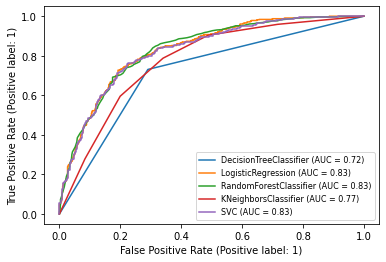

In [107]:
disp=plot_roc_curve(dt,x_test,y_test)
plot_roc_curve(lr,x_test,y_test,ax=disp.ax_)
plot_roc_curve(rf,x_test,y_test,ax=disp.ax_)
plot_roc_curve(knn,x_test,y_test,ax=disp.ax_)
plot_roc_curve(svc,x_test,y_test,ax=disp.ax_)
plt.legend(prop={'size':8},loc='lower right')
plt.show()